In [5]:
import requests
import json
import urllib.request

with open('keys.json', 'r') as f:
    data= json.load(f)
key = data['api']
def download_image_from_flickr(search_term, key):
    flickr_url = 'https://api.flickr.com/services/rest/'
    method = 'flickr.photos.search'
    payload = {
        'method': method,
        'api_key' : key,
        'text': search_term,
        'sort': 'relevance',
        'per_page' : 1,
        'format' : 'json',
        'nojsoncallback' : 1
    }

    response = requests.get(flickr_url, params=payload)
    response_dict = json.loads(response.content.decode('utf-8'))

    photo = response_dict['photos']['photo'][0]
    photo_id = photo['id']
    farm_id = photo['farm']
    server_id = photo['server']
    secret = photo['secret']
    photo_url = f'https://farm{farm_id}.staticflickr.com/{server_id}/{photo_id}_{secret}.jpg'

    image_name = f'{search_term.replace(" ", "_")}.jpg'
    urllib.request.urlretrieve(photo_url, image_name)

download_image_from_flickr("gonzaga university", key)

In [5]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np

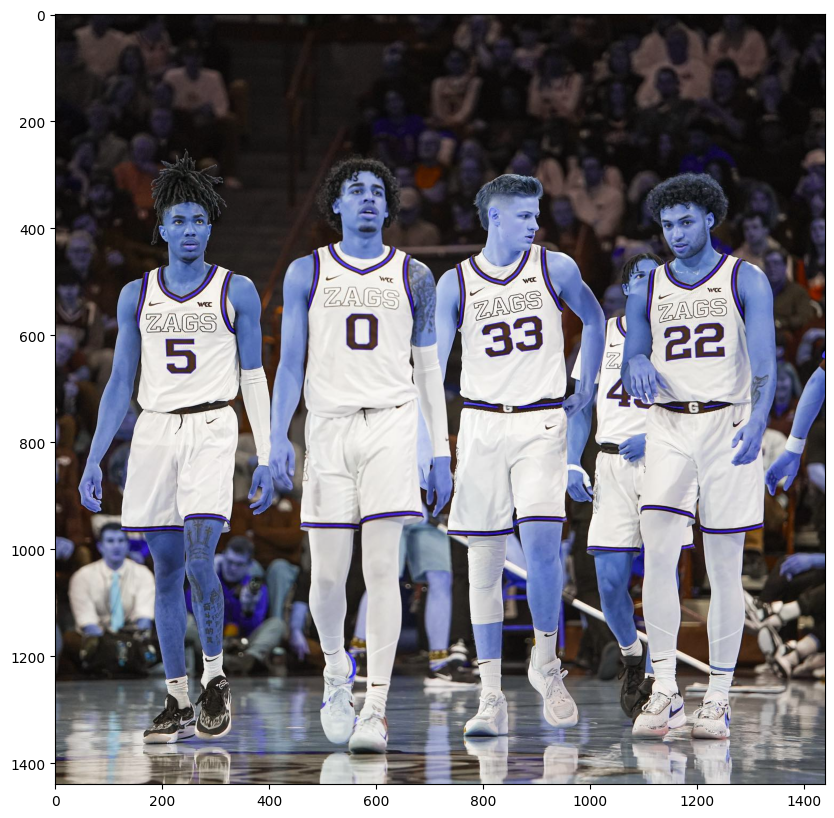

In [6]:
zags_img_path = "zags.jpg"
zags_img = cv2.imread(zags_img_path)
type(zags_img)
zags_img.shape

zags_img.max()

def plot_img(img, cmap=None):
    plt.figure(figsize=(10,10))
    plt.imshow(img, cmap=cmap)
    plt.show()

plot_img(zags_img)

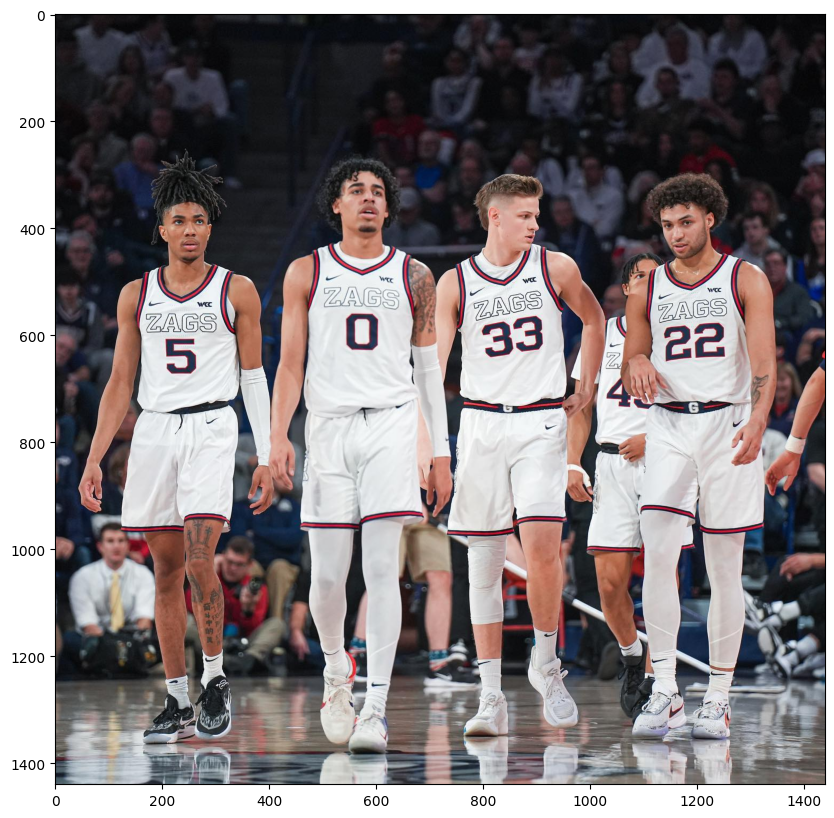

In [13]:
zags_img_rgb = cv2.cvtColor(zags_img, cv2.COLOR_BGR2RGB)
plot_img(zags_img_rgb)

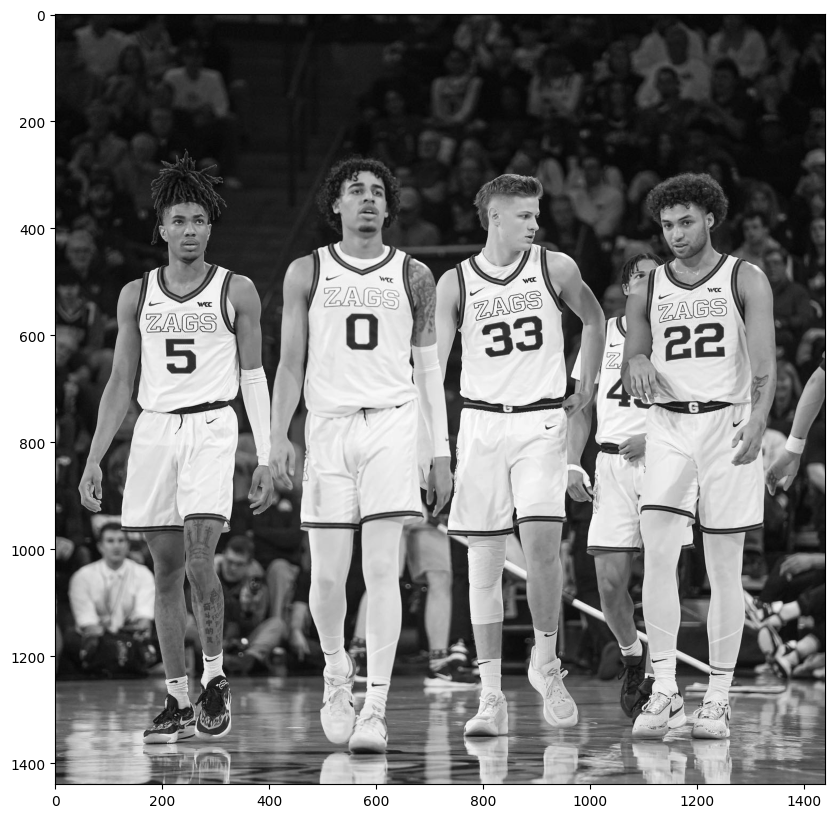

In [15]:
zags_img_gray = cv2.cvtColor(zags_img, cv2.COLOR_BGR2GRAY)
zags_img_gray.shape
plot_img(zags_img_gray, 'gray')

In [18]:
cv2.imwrite("zags_img_gray.jpg", zags_img_gray)

True

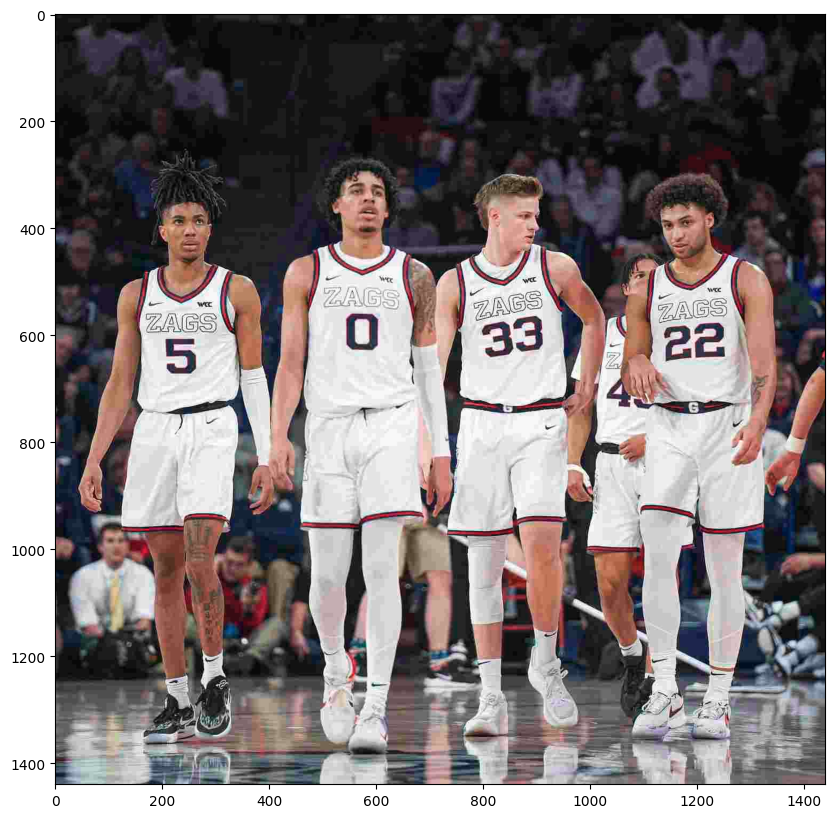

In [24]:
encode_param = [int(cv2.IMWRITE_JPEG_QUALITY),10]
_, encimg = cv2.imencode('.jpg', zags_img_rgb, encode_param)
decimg = cv2.imdecode(encimg,1)
plot_img(decimg)

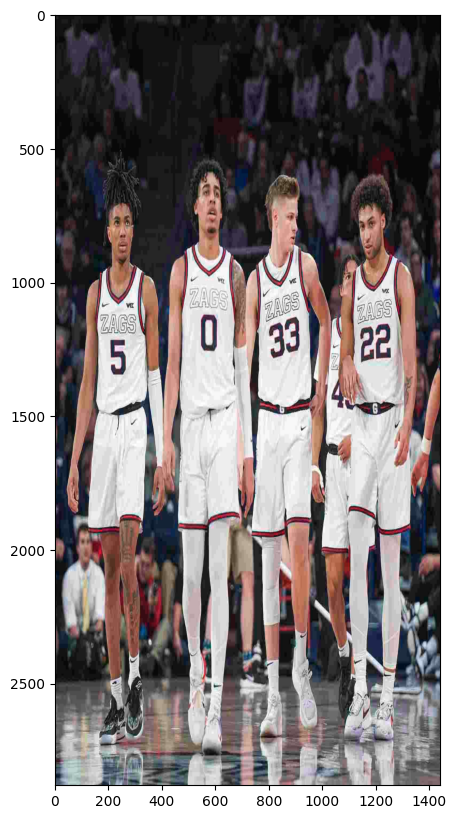

In [27]:
big_zags = cv2.resize(decimg, None, fx=1, fy=2, interpolation=cv2.INTER_LINEAR)
plot_img(big_zags)

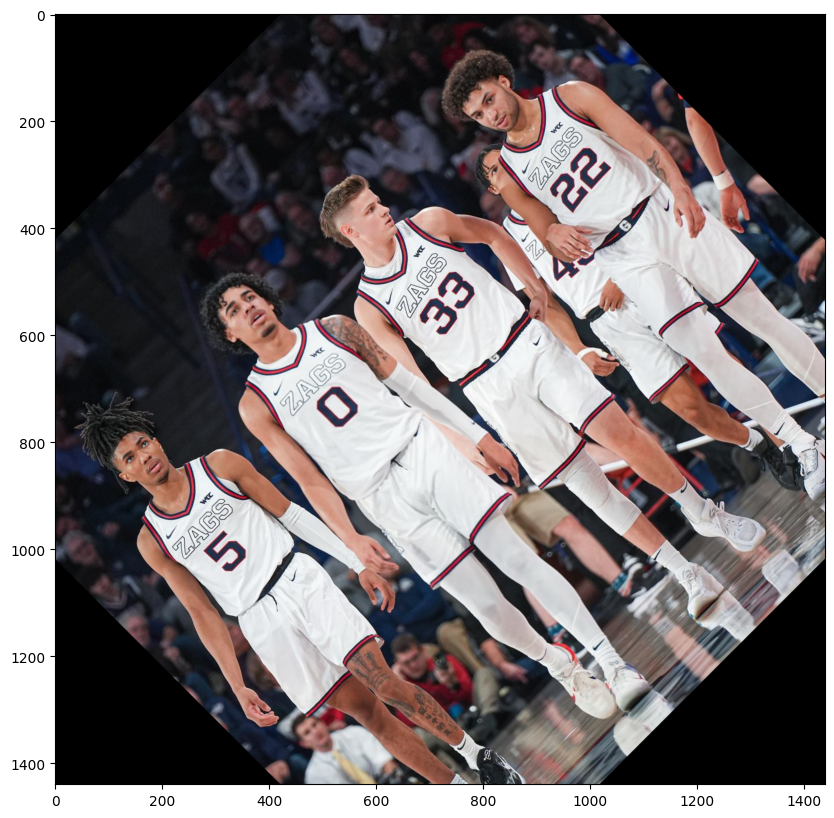

In [30]:
theta = 45.0
M = cv2.getRotationMatrix2D(center=(1440/2, 1440/2), angle = theta, scale=1)
rotated_zags = cv2.warpAffine(zags_img_rgb, M, (1440,1440))
plot_img(rotated_zags)

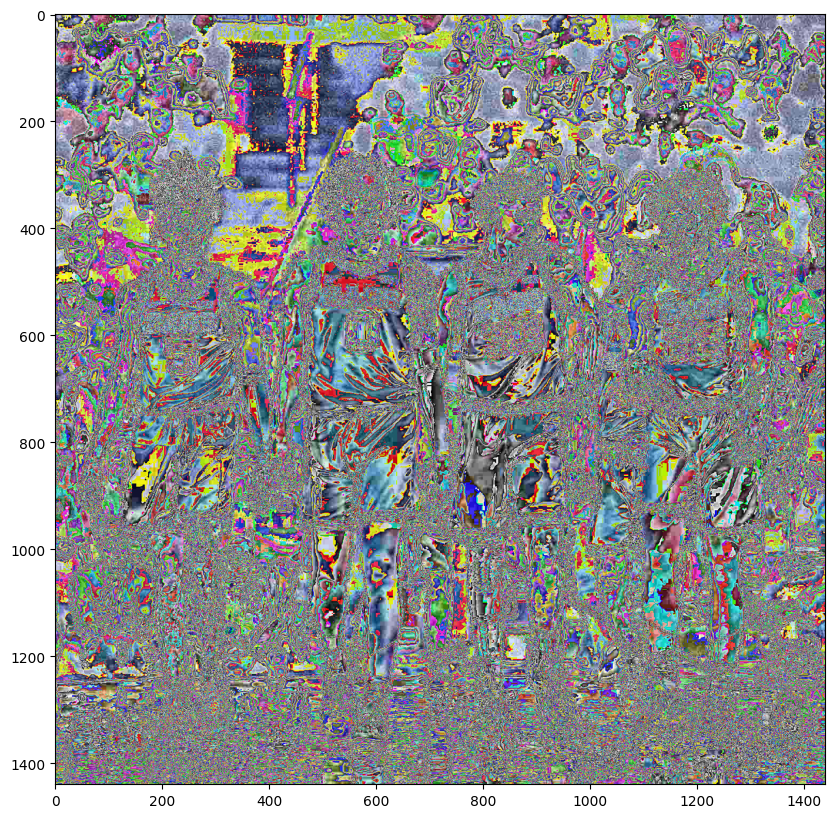

In [32]:
zags_color = 15 * zags_img_rgb
plot_img(zags_color)

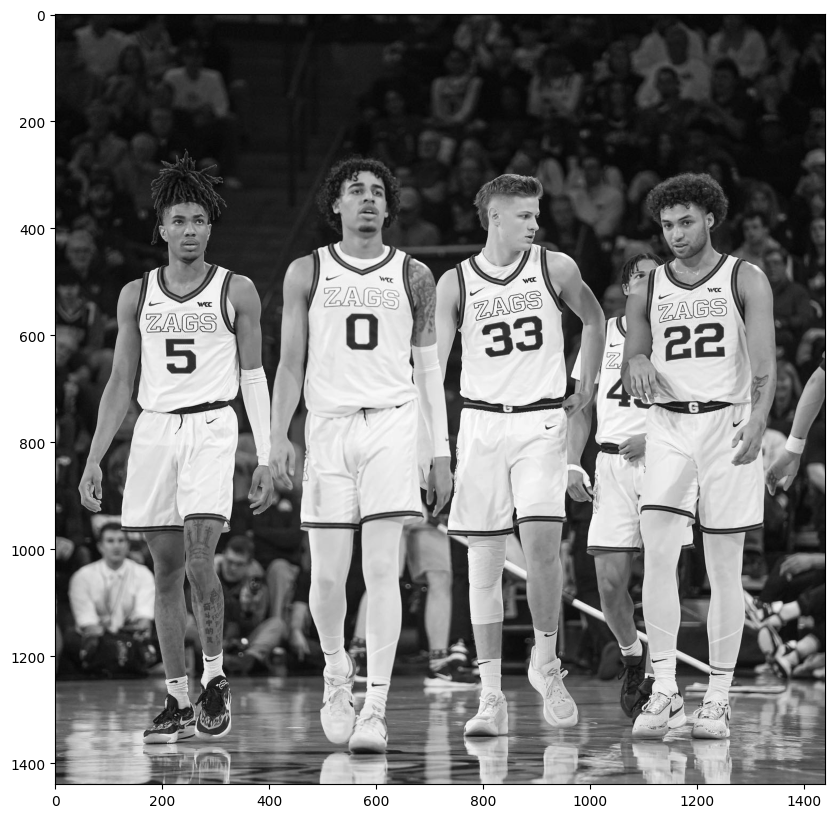

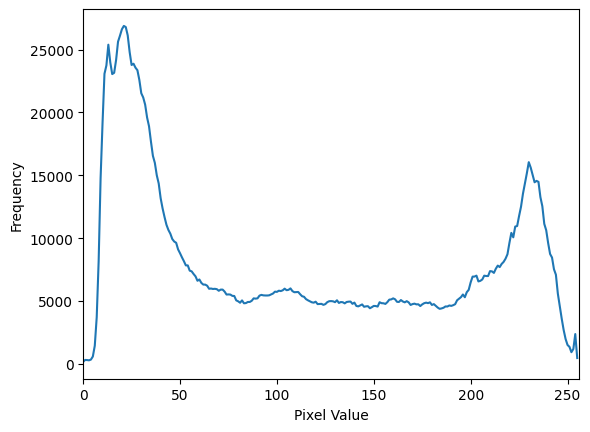

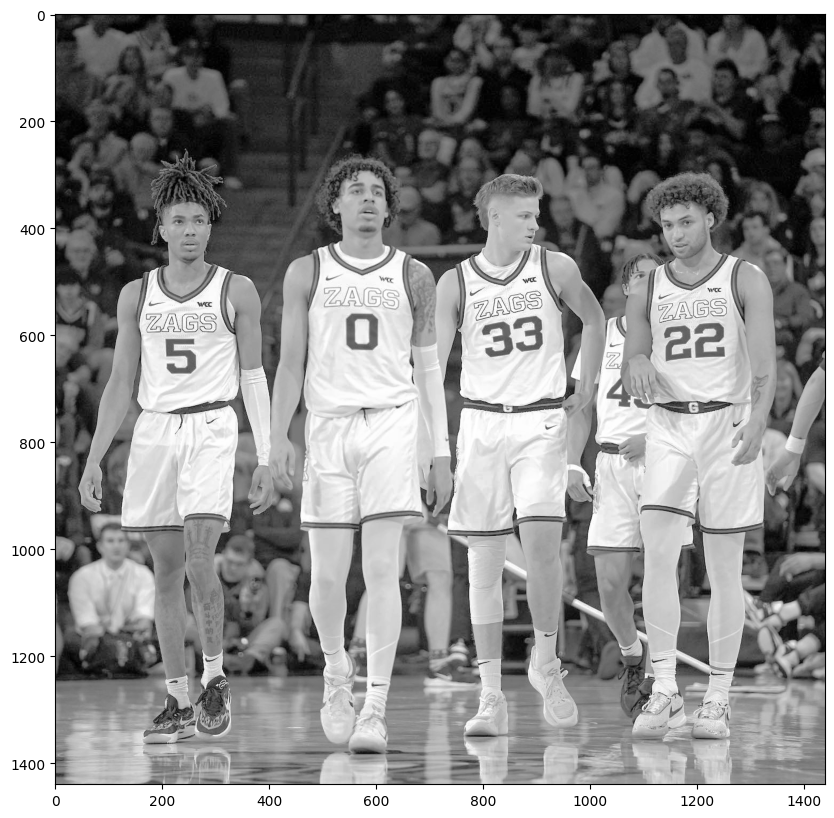

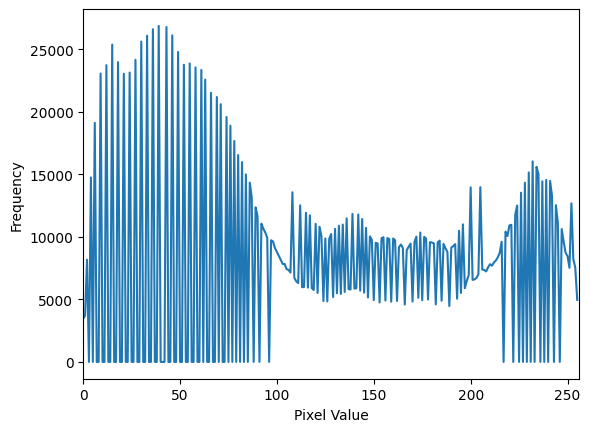

In [35]:
def plot_hist(img):
    hist = cv2.calcHist([img],[0], None, [256], [0,256])
    plt.plot(hist)
    plt.xlim([0,256])
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")
    plt.show()

plot_img(zags_img_gray, 'gray')
plot_hist(zags_img_gray)

equalized_zags_gray = cv2.equalizeHist(zags_img_gray)
plot_img(equalized_zags_gray, "gray")
plot_hist(equalized_zags_gray)

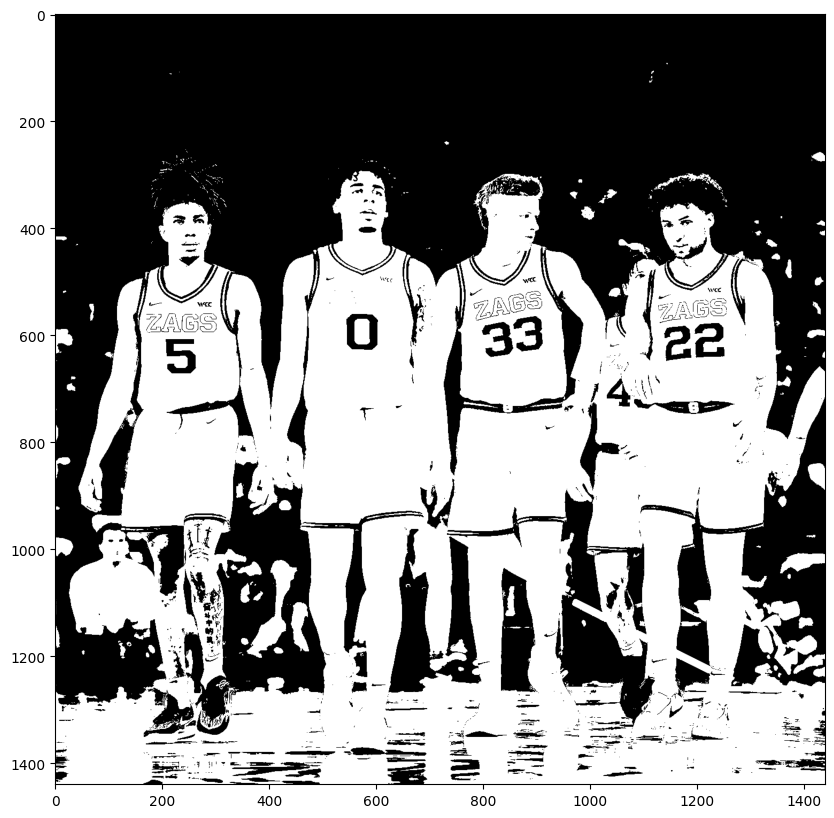

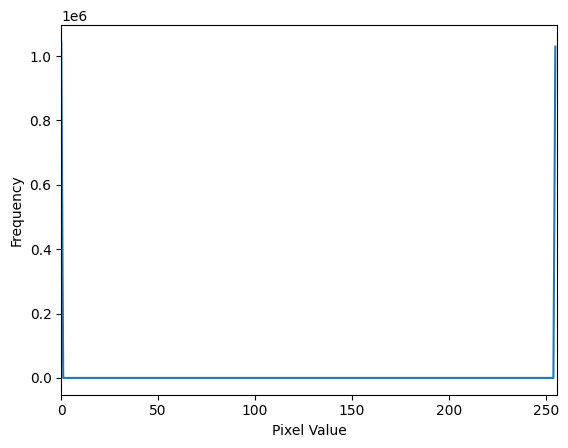

In [40]:
def thresholding(input_img, threshold, max_val=255, min_val=0):
    N,M = input_img.shape
    image_out = np.zeros((N,M), dtype=np.uint8)

    for i in range(N):
        for j in range(M):
            if input_img[i,j]> threshold:
                image_out[i,j] = max_val
            else:
                image_out[i,j] = min_val
    return image_out

threshold_zags = thresholding(zags_img_gray, 88)
plot_img(threshold_zags, "gray")
plot_hist(threshold_zags)

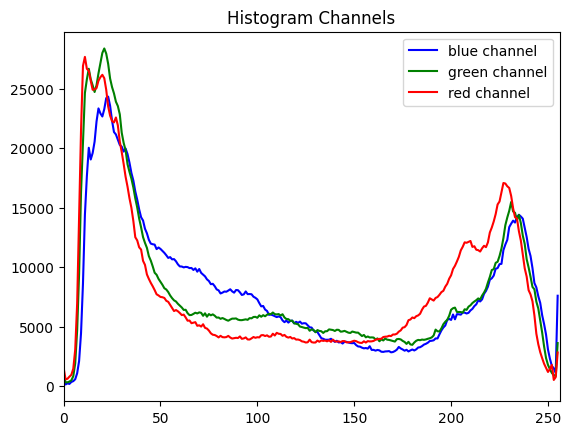

In [7]:
color = ('blue','green','red')
intensity_values=np.array([x for x in range(256)])
for i,col in enumerate(color):
    histr = cv2.calcHist([zags_img],[i],None,[256],[0,256])
    plt.plot(intensity_values,histr,color = col,label=col+" channel")
    plt.xlim([0,256])
plt.legend()
plt.title("Histogram Channels")
plt.show()